# i211715 Umm e Hani
# i211769 Abdul Haque

In [1]:
!nvidia-smi

Wed May  8 20:11:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.5/756.5 kB 12.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

# Use the YOLO Model

In [3]:
from ultralytics import YOLO
import os
from IPython.display import Image, display
from IPython import display as display2
display2.clear_output()

# Get the dataset

In [4]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.1

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dboAotBhlwkX0T2eCZO8")
project = rf.workspace("pakistani-clothes-shalwar-kameez-frok-watches-and-grocery").project("pakistani-images-dataset")
version = project.version(3)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.10, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Pakistani-Images-Dataset-3 in yolov8:: 100%|██████████| 1418/1418 [00:00<00:00, 5134.91it/s]


In [ ]:
!yolo task=segment mode=train model=yolov8m-seg.pt data={dataset.location}/data.yaml epochs=30 imgsz=640 name="Custom_model_segmentV2" save=True

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/content/Pakistani-Images-Dataset-3/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=Custom_model_segmentV2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False

# Results for Custom_model_segmentV1

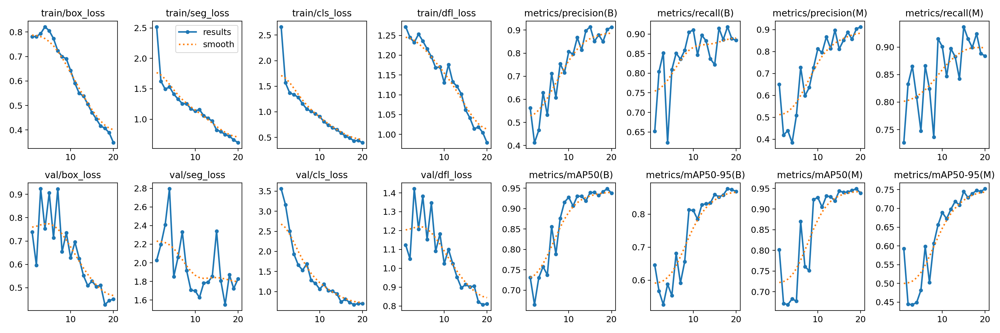

In [ ]:
Image(filename=f'/content/runs/segment/Custom_model_segment/results.png', width=700)

# Version 4 of the dataset

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dboAotBhlwkX0T2eCZO8")
project = rf.workspace("pakistani-clothes-shalwar-kameez-frok-watches-and-grocery").project("pakistani-images-dataset")
version = project.version(4)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.11, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Pakistani-Images-Dataset-4 in yolov8:: 100%|██████████| 1904/1904 [00:00<00:00, 5174.95it/s]


# Train the V4 on yolo v8

In [6]:
!yolo task=segment mode=train model=yolov8m-seg.pt data={dataset.location}/data.yaml epochs=30 imgsz=640 name="Custom_model_segmentV4" save=True

100% 52.4M/52.4M [00:00<00:00, 264MB/s]
Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/content/Pakistani-Images-Dataset-4/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=Custom_model_segmentV4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt

# Results for Custom_model_segmentV4

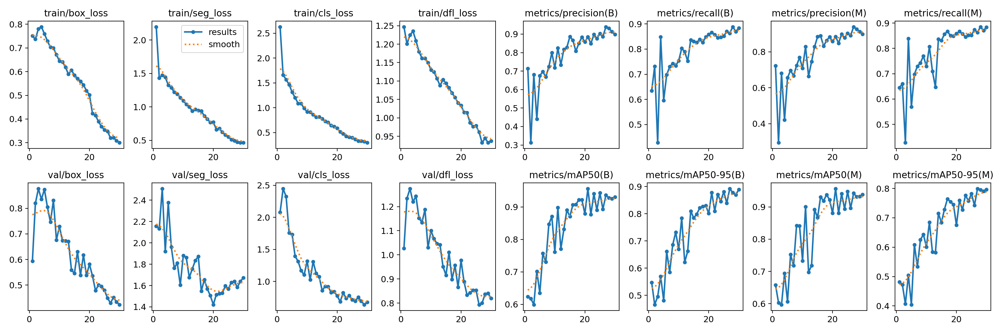

In [7]:
Image(filename=f'/content/runs/segment/Custom_model_segmentV4/results.png', width=700)

# Validation for V4

In [8]:
!yolo task=segment mode=val model=/content/runs/segment/Custom_model_segmentV4/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27233964 parameters, 0 gradients, 110.0 GFLOPs
val: Scanning /content/Pakistani-Images-Dataset-4/valid/labels.cache... 56 images, 0 backgrounds, 0 corrupt: 100% 56/56 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 4/4 [00:09<00:00,  2.29s/it]
                   all         56         94       0.94      0.863      0.936      0.893       0.94      0.863      0.943      0.798
                Bottle         56         14          1      0.367       0.65      0.575          1      0.367      0.688      0.542
             Deoderant         56          8      0.974          1      0.995      0.962      0.974          1      0.995      0.995
              Earrings         56          4      0.992       0.75      0.856      0.618      0.992       0.75      0.856

# Predictions for V4

In [9]:
!yolo task=segment mode=predict model=/content/runs/segment/Custom_model_segmentV4/weights/best.pt conf=0.5 source={dataset.location}/test/images

Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27233964 parameters, 0 gradients, 110.0 GFLOPs

image 1/54 /content/Pakistani-Images-Dataset-4/test/images/20240508_011839_jpg.rf.28a1f445ee512a33a2b7b397302cf7bc.jpg: 640x640 (no detections), 45.8ms
image 2/54 /content/Pakistani-Images-Dataset-4/test/images/20240508_011842_jpg.rf.7c7e9d63228014b861149a7a6a3319e2.jpg: 640x640 1 Lotion-Vaseline, 45.9ms
image 3/54 /content/Pakistani-Images-Dataset-4/test/images/20240508_124314_jpg.rf.68f57c6b2d24117142e8b86bbf23d0f8.jpg: 640x640 1 Deoderant, 45.9ms
image 4/54 /content/Pakistani-Images-Dataset-4/test/images/20240508_124324_mp4-0000_jpg.rf.07753de65be5e319e3545a8a1525f2ed.jpg: 640x640 3 Deoderants, 45.7ms
image 5/54 /content/Pakistani-Images-Dataset-4/test/images/20240508_124351_jpg.rf.95e683d388318705d131b79b41cd0333.jpg: 640x640 1 Deoderant, 43.0ms
image 6/54 /content/Pakistani-Images-Dataset-4/test/images/20240

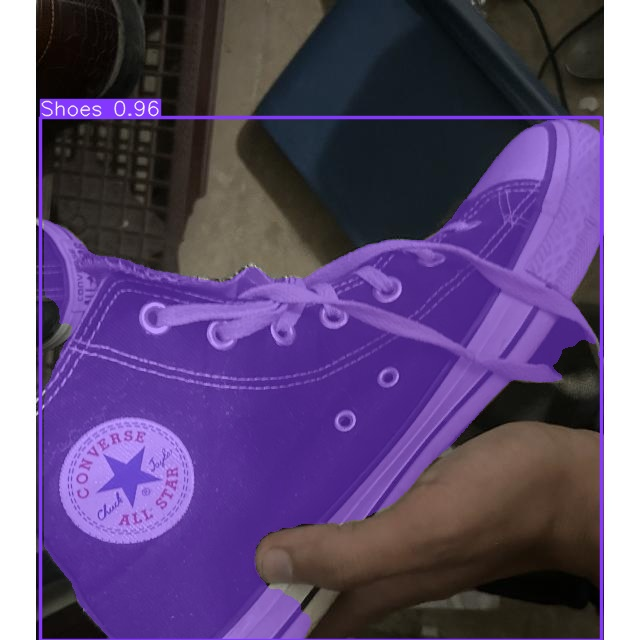

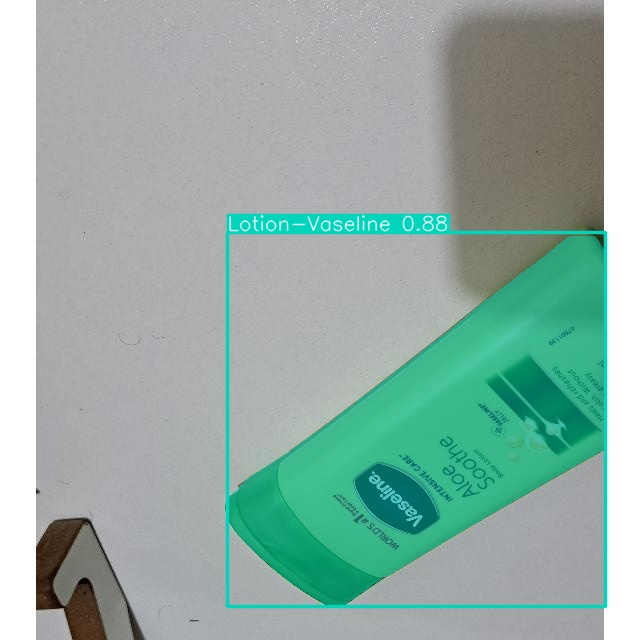

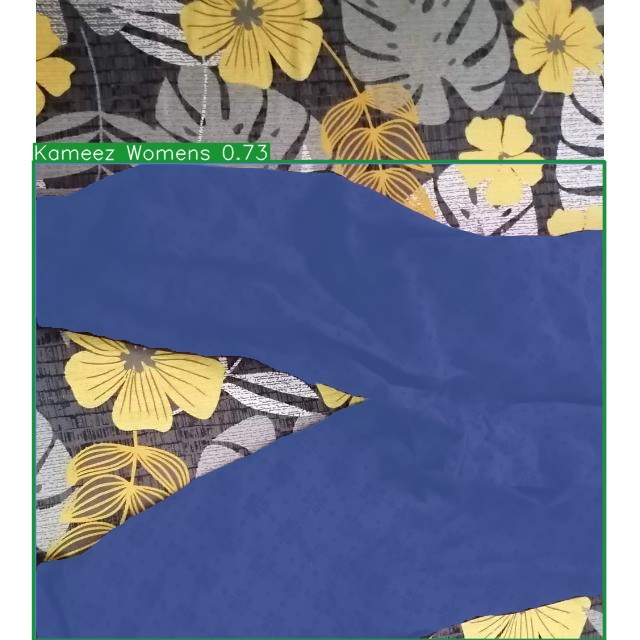

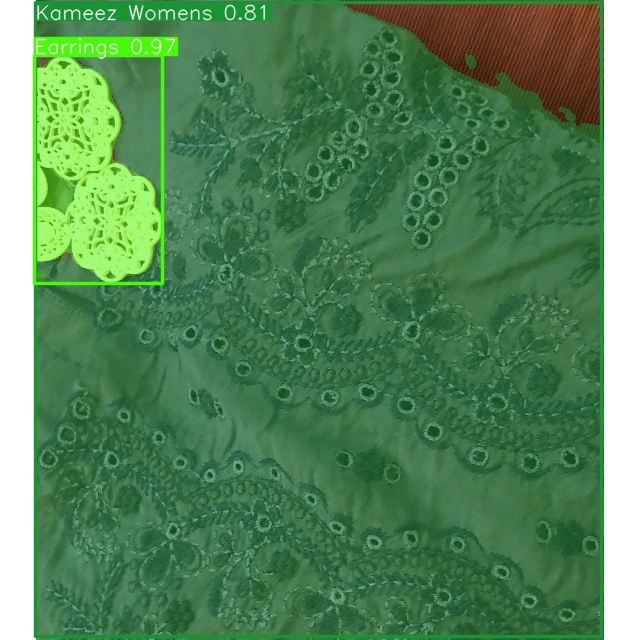

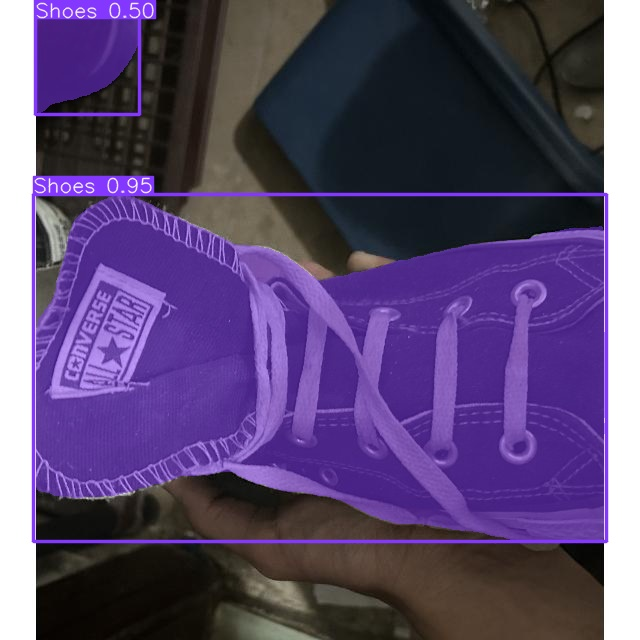

...

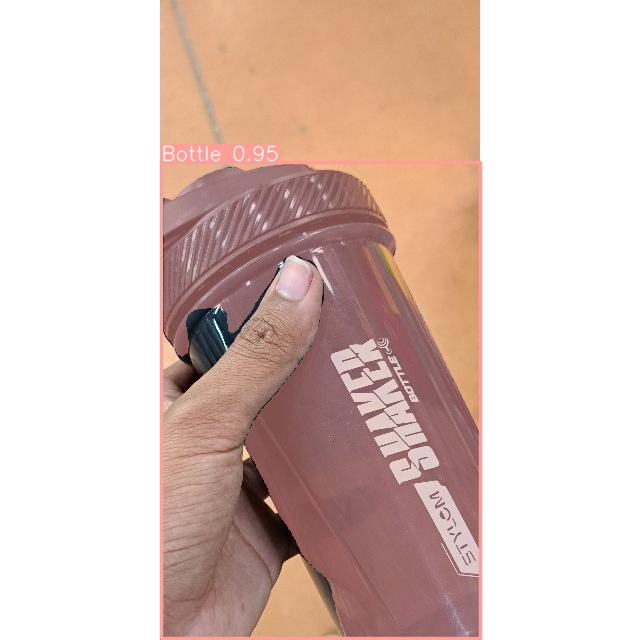

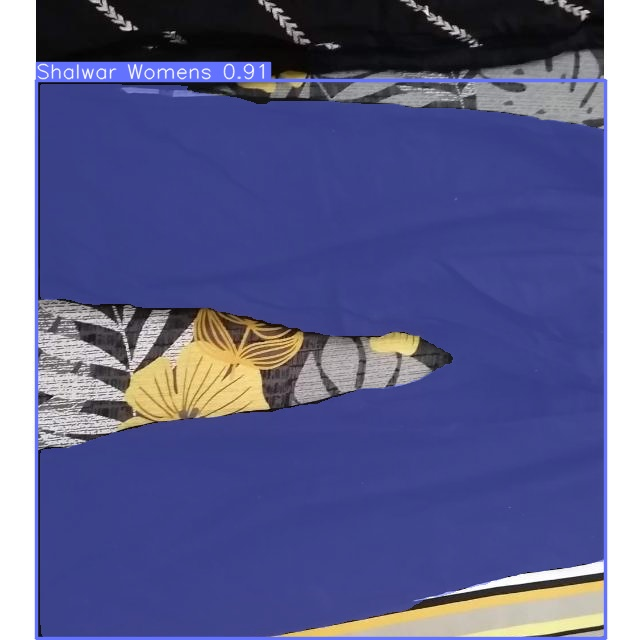

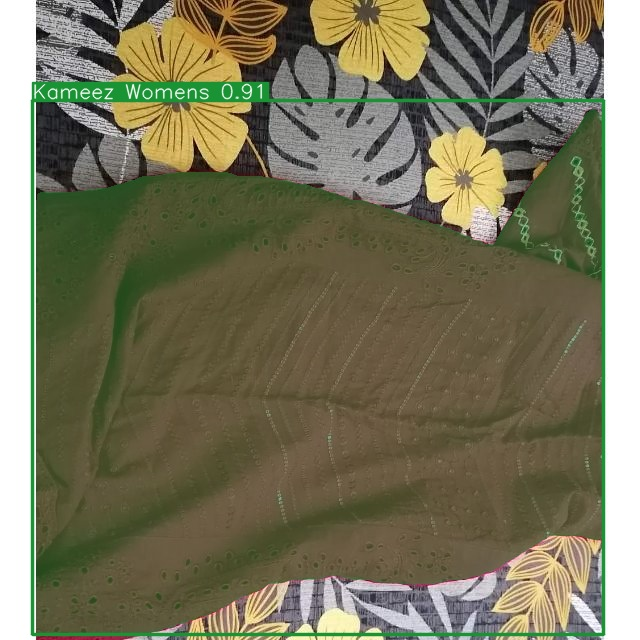

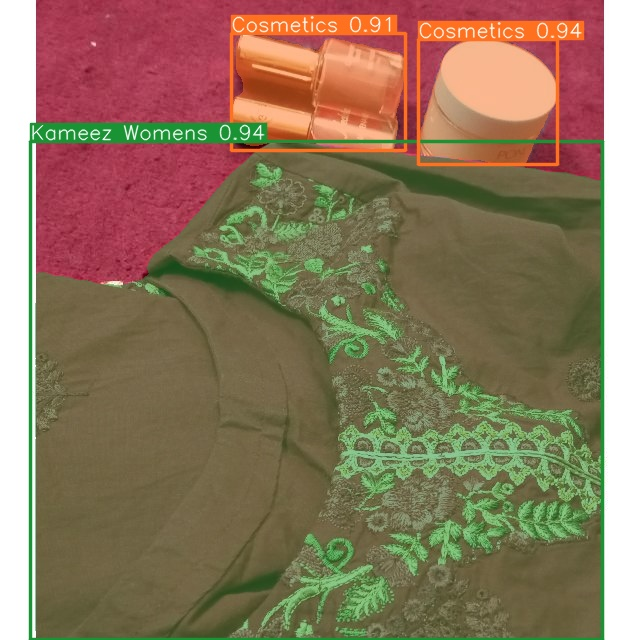

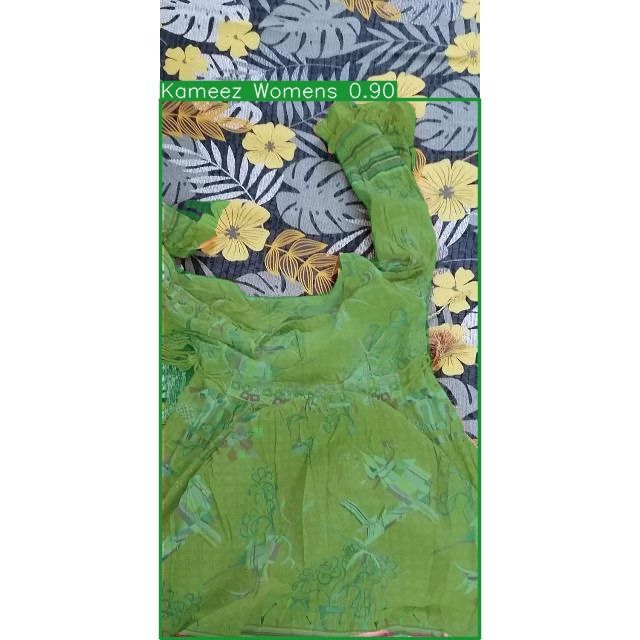

In [10]:
import glob
from IPython.display import Image, display

for path in glob.glob(f'/content/runs/segment/predict/*.jpg'):
  display(Image(filename=path, height=600))
  print('\n')

# Results for Custom_model_segmentV2

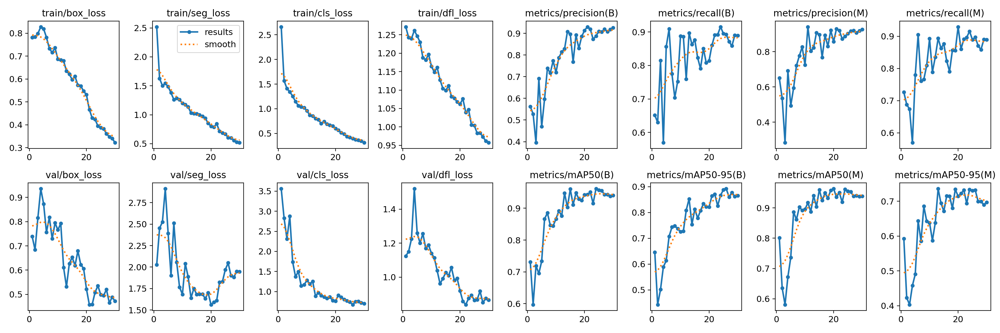

In [ ]:
Image(filename=f'/content/runs/segment/Custom_model_segmentV2/results.png', width=700)

# Validation for Custom_model_segmentV1

In [ ]:
!yolo task=segment mode=val model=/content/runs/segment/Custom_model_segment/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27231648 parameters, 0 gradients, 110.0 GFLOPs
val: Scanning /content/Pakistani-Images-Dataset-3/valid/labels.cache... 45 images, 0 backgrounds, 0 corrupt: 100% 45/45 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 3/3 [00:07<00:00,  2.36s/it]
                   all         45         69      0.849      0.918      0.942      0.877      0.856      0.924      0.945      0.748
              Earrings         45          4      0.752          1      0.895       0.68      0.756          1      0.895      0.572
            Headphones         45          1      0.873          1      0.995      0.995      0.874          1      0.995      0.895
         Kameez Womens         45         22       0.95      0.866      0.969      0.926          1      0.911      0.993

# Prediction rsults for Custom_model_segmentV1

In [ ]:
!yolo task=segment mode=predict model=/content/runs/segment/Custom_model_segment/weights/best.pt conf=0.5 source={dataset.location}/test/images

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27231648 parameters, 0 gradients, 110.0 GFLOPs

image 1/34 /content/Pakistani-Images-Dataset-3/test/images/20240508_011839_jpg.rf.28a1f445ee512a33a2b7b397302cf7bc.jpg: 640x640 (no detections), 45.9ms
image 2/34 /content/Pakistani-Images-Dataset-3/test/images/20240508_011842_jpg.rf.7c7e9d63228014b861149a7a6a3319e2.jpg: 640x640 1 Lotion-Vaseline, 44.0ms
image 3/34 /content/Pakistani-Images-Dataset-3/test/images/IMG_0001_jpg.rf.da7d2f2342297ed615124fea68a3e6e0.jpg: 640x640 1 Earrings, 1 Kameez Womens, 45.9ms
image 4/34 /content/Pakistani-Images-Dataset-3/test/images/IMG_0005_jpg.rf.dd6eb9d9be6e69a79187c082bb509f83.jpg: 640x640 1 Kameez Womens, 45.9ms
image 5/34 /content/Pakistani-Images-Dataset-3/test/images/IMG_0006_jpg.rf.2b8025548384c7d5bbf973a8d5b2d7d9.jpg: 640x640 1 Earrings, 1 Kameez Womens, 40.0ms
image 6/34 /content/Pakistani-Images-Dataset-3/test/images/

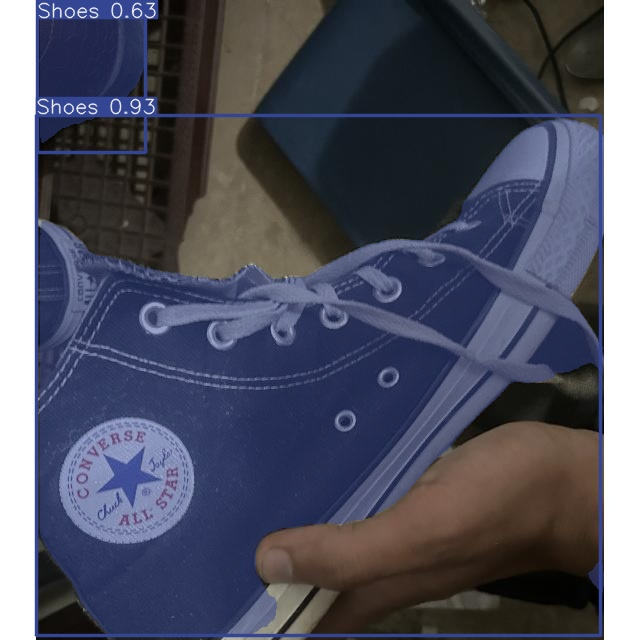

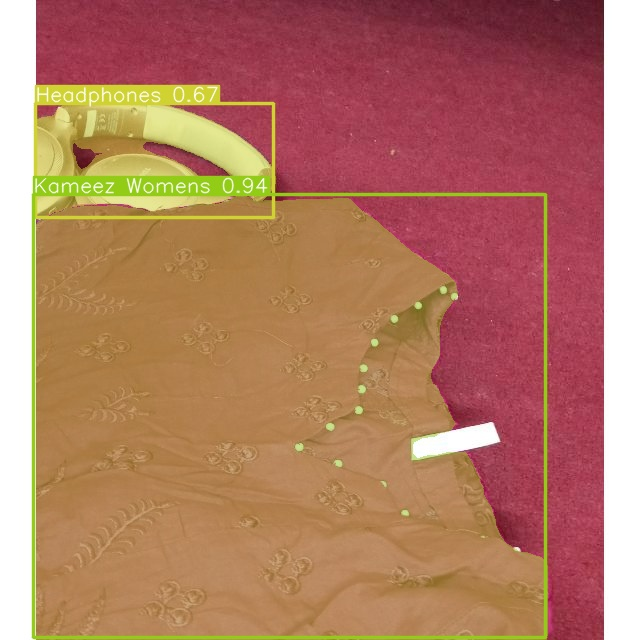

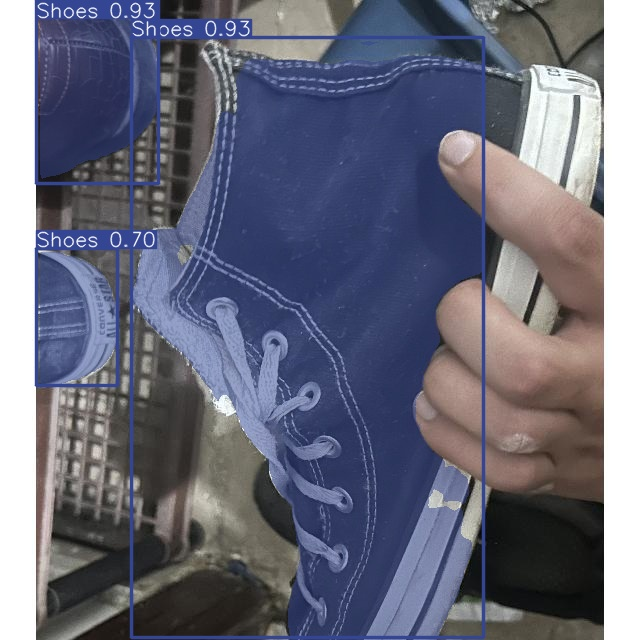

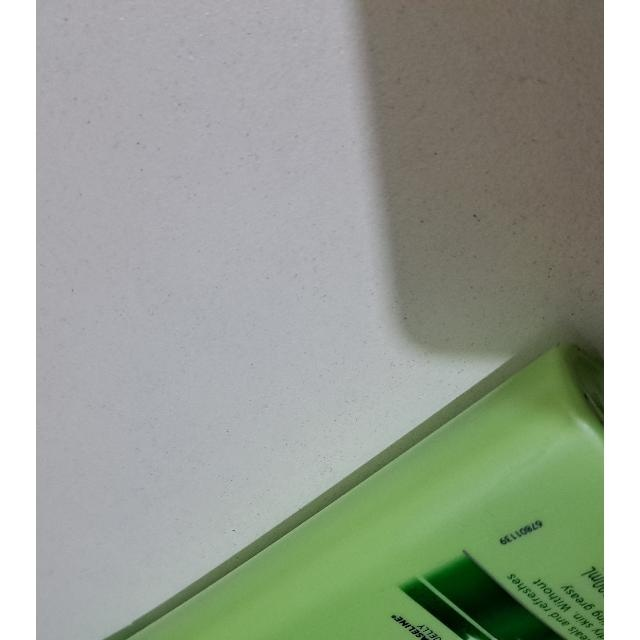

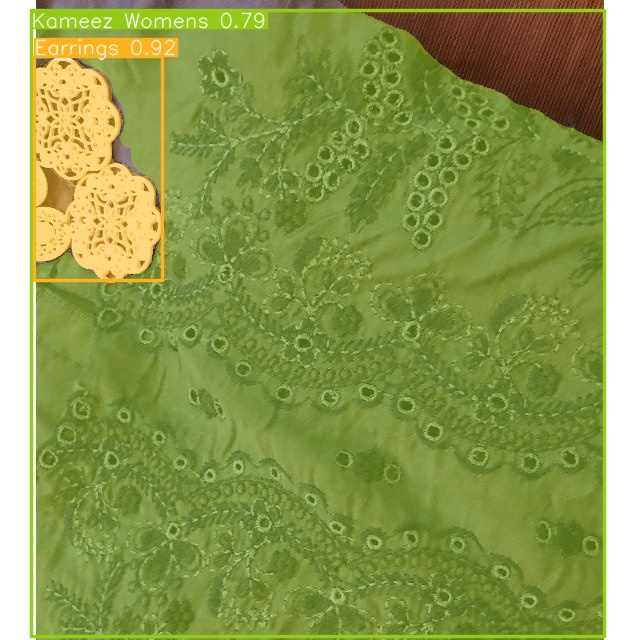

...

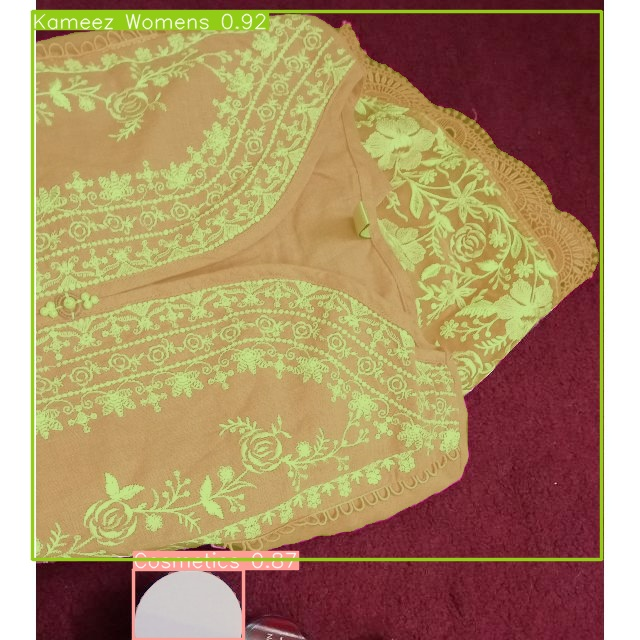

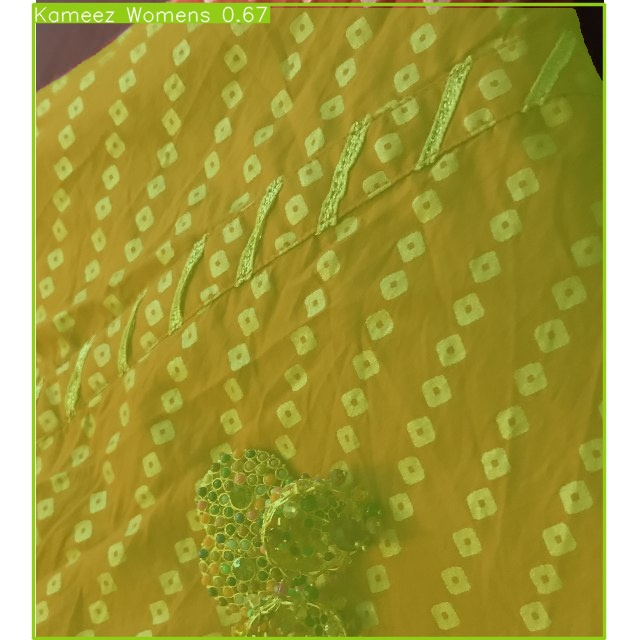

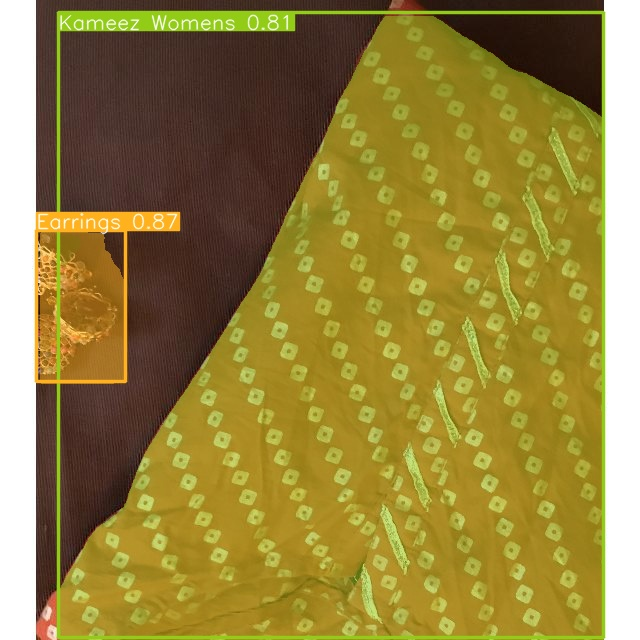

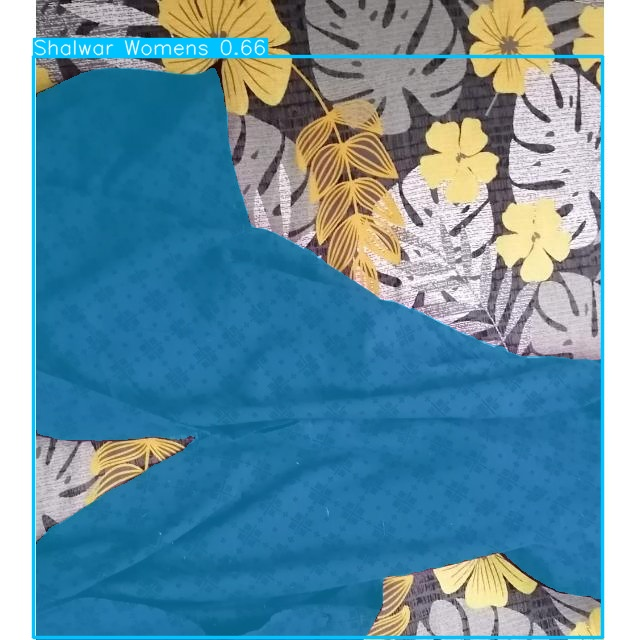

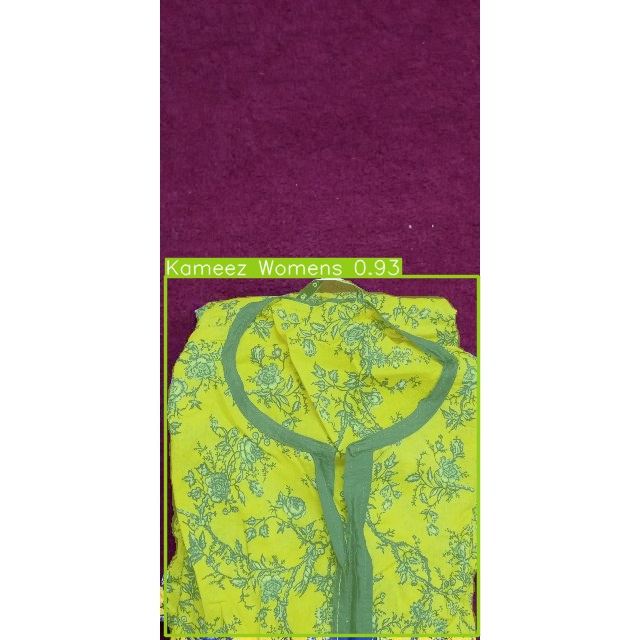

In [ ]:
import glob
from IPython.display import Image, display

for path in glob.glob(f'/content/runs/segment/predict/*.jpg'):
  display(Image(filename=path, height=600))
  print('\n')

# Validation for Custom_model_segmentV2

In [ ]:
!yolo task=segment mode=val model=/content/runs/segment/Custom_model_segmentV2/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27231648 parameters, 0 gradients, 110.0 GFLOPs
val: Scanning /content/Pakistani-Images-Dataset-3/valid/labels.cache... 45 images, 0 backgrounds, 0 corrupt: 100% 45/45 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 3/3 [00:06<00:00,  2.26s/it]
                   all         45         69      0.907      0.893      0.955      0.892      0.917      0.897      0.953      0.732
              Earrings         45          4      0.943       0.75      0.845       0.66      0.952       0.75      0.845      0.585
            Headphones         45          1      0.919          1      0.995      0.995      0.922          1      0.995      0.697
         Kameez Womens         45         22      0.946      0.801      0.967      0.941          1      0.842       0.99

# Predictions for Custom_model_segmentV2

In [ ]:
!yolo task=segment mode=predict model=/content/runs/segment/Custom_model_segmentV2/weights/best.pt conf=0.5 source={dataset.location}/test/images

Ultralytics YOLOv8.2.10 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27231648 parameters, 0 gradients, 110.0 GFLOPs

image 1/34 /content/Pakistani-Images-Dataset-3/test/images/20240508_011839_jpg.rf.28a1f445ee512a33a2b7b397302cf7bc.jpg: 640x640 1 glasses, 45.9ms
image 2/34 /content/Pakistani-Images-Dataset-3/test/images/20240508_011842_jpg.rf.7c7e9d63228014b861149a7a6a3319e2.jpg: 640x640 1 Lotion-Vaseline, 45.9ms
image 3/34 /content/Pakistani-Images-Dataset-3/test/images/IMG_0001_jpg.rf.da7d2f2342297ed615124fea68a3e6e0.jpg: 640x640 1 Earrings, 1 Kameez Womens, 45.8ms
image 4/34 /content/Pakistani-Images-Dataset-3/test/images/IMG_0005_jpg.rf.dd6eb9d9be6e69a79187c082bb509f83.jpg: 640x640 1 Kameez Womens, 45.8ms
image 5/34 /content/Pakistani-Images-Dataset-3/test/images/IMG_0006_jpg.rf.2b8025548384c7d5bbf973a8d5b2d7d9.jpg: 640x640 1 Earrings, 1 Kameez Womens, 45.8ms
image 6/34 /content/Pakistani-Images-Dataset-3/test/images/IMG_00

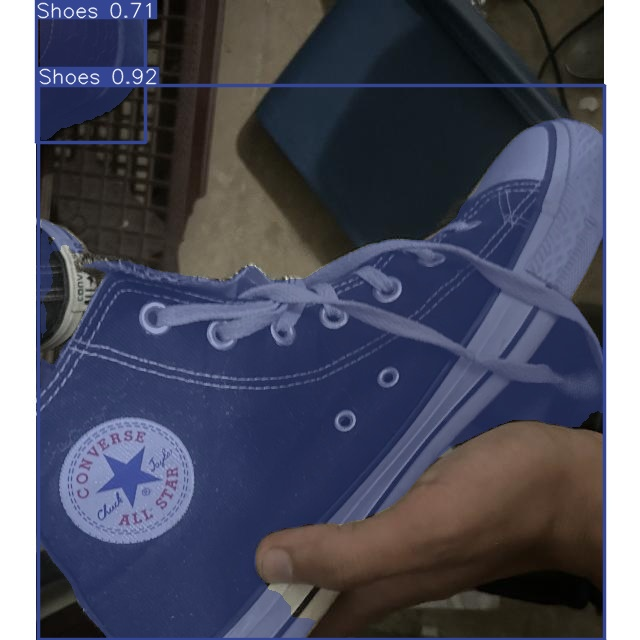

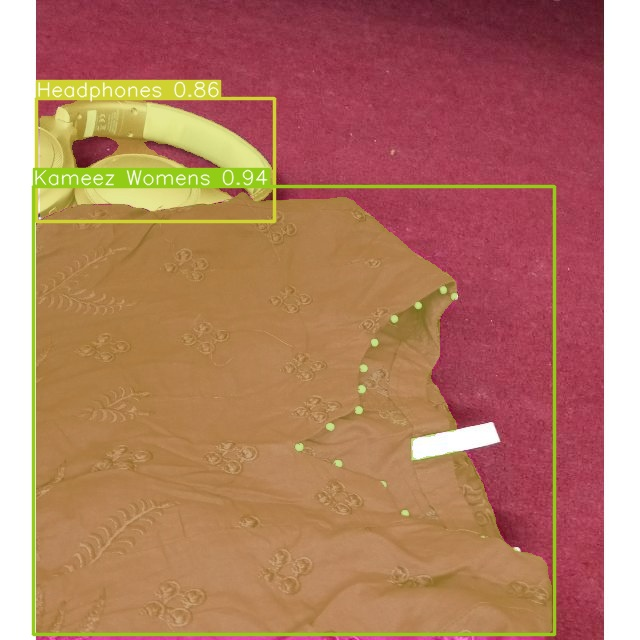

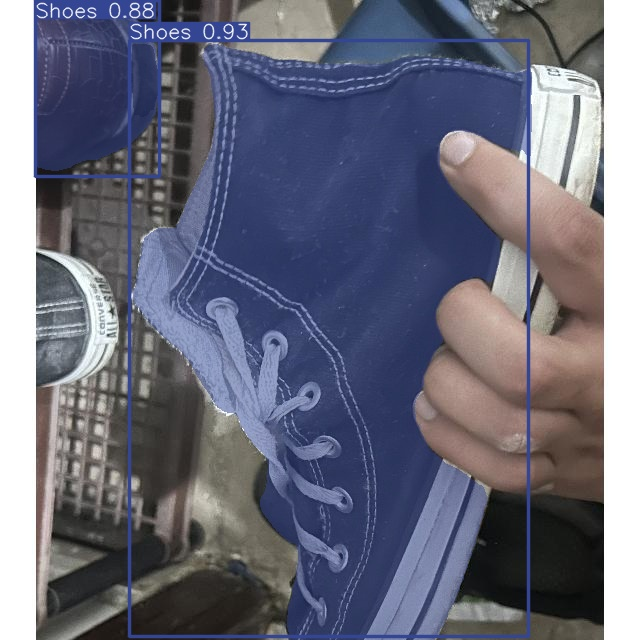

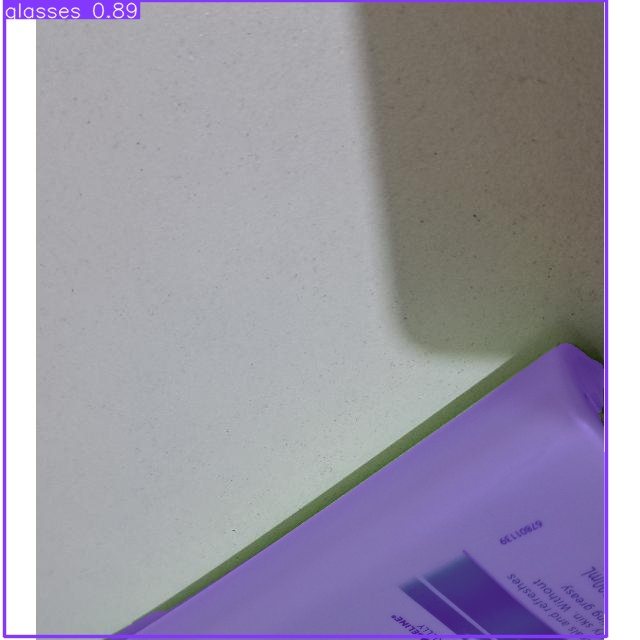

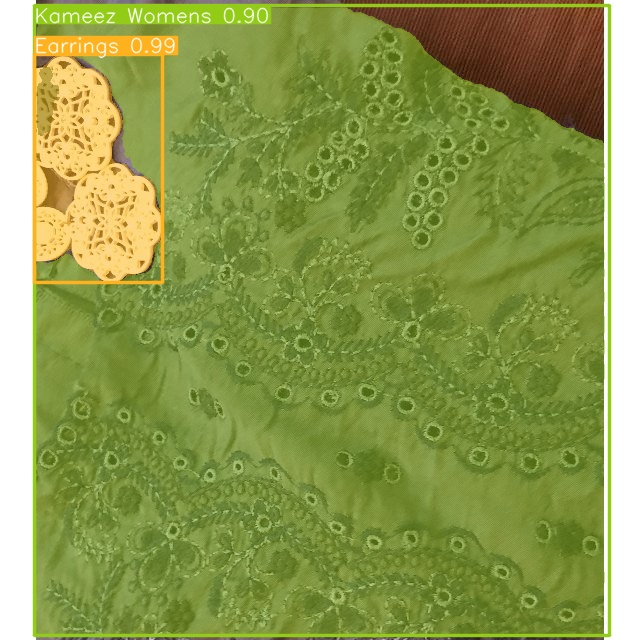

...

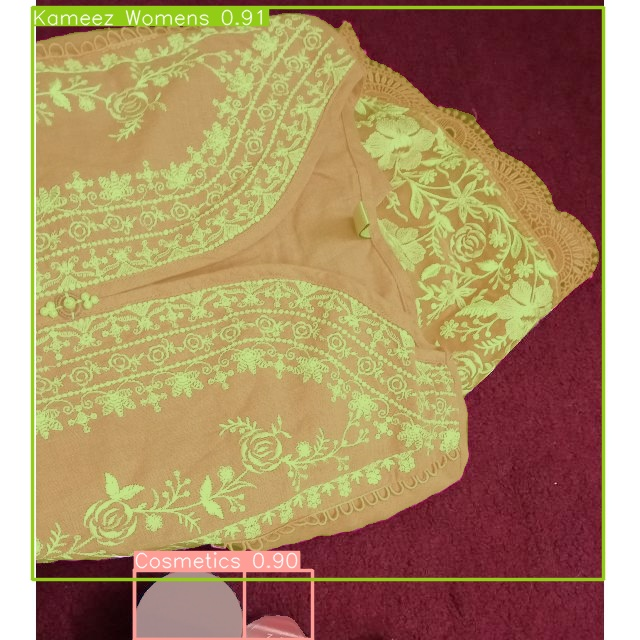

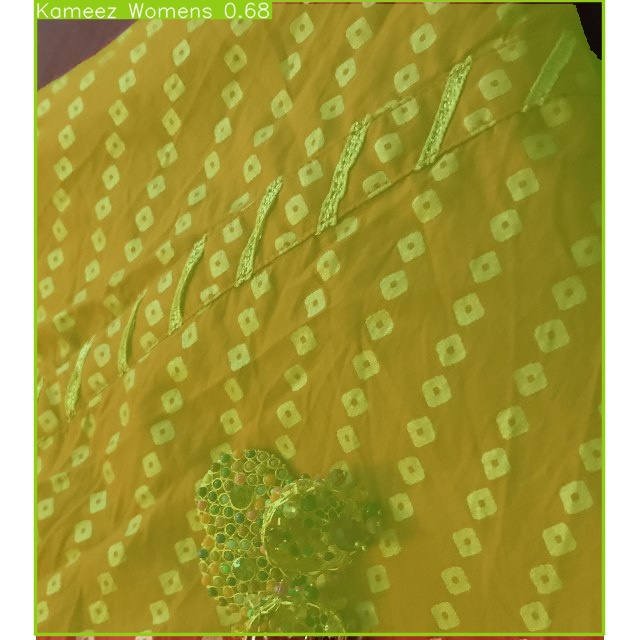

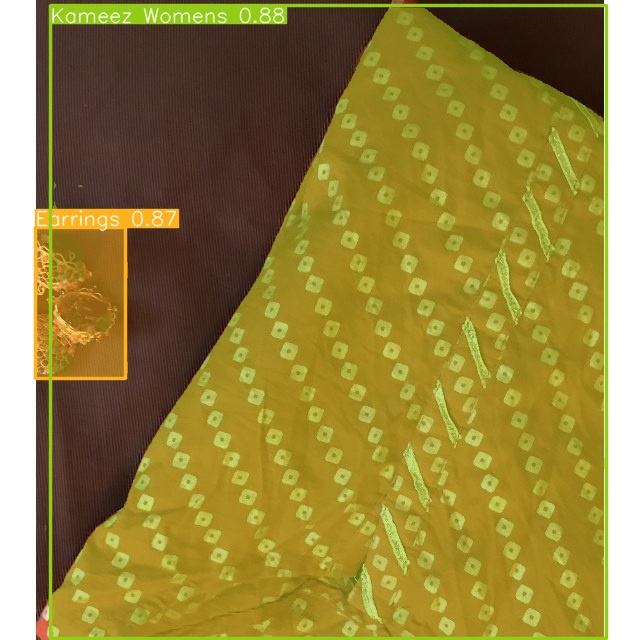

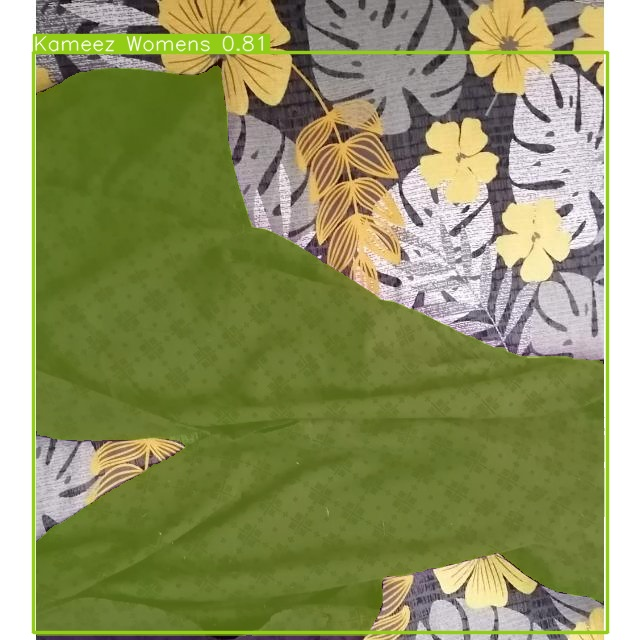

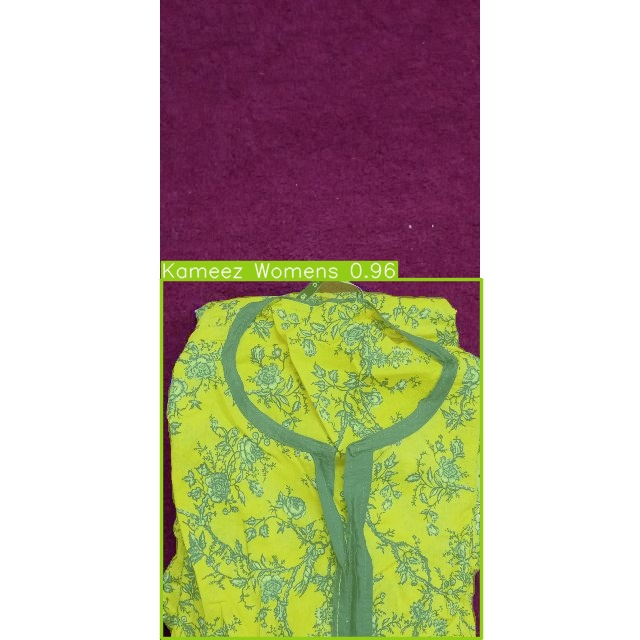

In [ ]:
import glob
from IPython.display import Image, display

for path in glob.glob(f'/content/runs/segment/predict2/*.jpg'):
  display(Image(filename=path, height=600))
  print('\n')

## As Above results show we can use Custom_model_segmentV1 for predictions as it is more accurate while V2 is overfitted.

# Download the files

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [12]:
%cd /content/runs

/content/runs


In [13]:
!zip -r models.zip /content/runs

  adding: content/runs/ (stored 0%)
  adding: content/runs/segment/ (stored 0%)
  adding: content/runs/segment/Custom_model_segmentV4/ (stored 0%)
  adding: content/runs/segment/Custom_model_segmentV4/MaskP_curve.png (deflated 8%)
  adding: content/runs/segment/Custom_model_segmentV4/weights/ (stored 0%)
  adding: content/runs/segment/Custom_model_segmentV4/weights/best.pt (deflated 8%)
  adding: content/runs/segment/Custom_model_segmentV4/weights/last.pt (deflated 8%)
  adding: content/runs/segment/Custom_model_segmentV4/BoxF1_curve.png (deflated 5%)
  adding: content/runs/segment/Custom_model_segmentV4/train_batch1060.jpg (deflated 13%)
  adding: content/runs/segment/Custom_model_segmentV4/MaskF1_curve.png (deflated 5%)
  adding: content/runs/segment/Custom_model_segmentV4/results.png (deflated 6%)
  adding: content/runs/segment/Custom_model_segmentV4/confusion_matrix_normalized.png (deflated 18%)
  adding: content/runs/segment/Custom_model_segmentV4/train_batch1062.jpg (deflated 8%)

In [14]:
from google.colab import files
files.download('models.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Use the model which we downloaded 


0: 640x640 2 Watchs, 148.2ms
Speed: 3.0ms preprocess, 148.2ms inference, 4549.2ms postprocess per image at shape (1, 3, 640, 640)


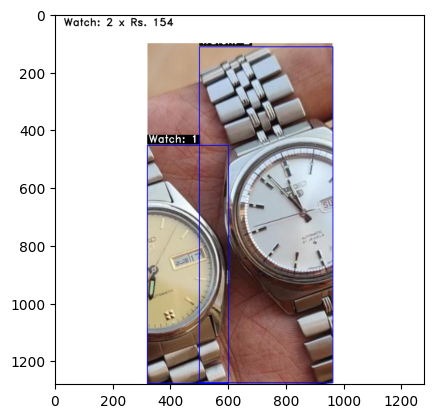

In [2]:
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt
import numpy as np
import random

# choose model
model = YOLO('best_model/best_V3.pt')

# write function for predicting 
def predict(chosen_model, img, classes=[], conf=0.8):
    if classes:
        results = chosen_model.predict(img, classes=classes, conf=conf)
    else:
        results = chosen_model.predict(img, conf=conf)

    return results

def predict_and_detect(chosen_model, img, classes=[], conf=0.8):
    results = predict(chosen_model, img, classes, conf=conf)

    # Resize image for better visibility of the bill
    img = cv2.resize(img, (img.shape[1] * 2, img.shape[0] * 2))

    for result in results:
        class_counts = {}
        for box in result.boxes:
            # Draw bounding box
            cv2.rectangle(img, (int(box.xyxy[0][0] * 2), int(box.xyxy[0][1] * 2)),
                          (int(box.xyxy[0][2] * 2), int(box.xyxy[0][3] * 2)), (255, 0, 0), 2)
            
            # Get class name
            class_name = result.names[int(box.cls[0])]
            class_counts[class_name] = class_counts.get(class_name, 0) + 1
            
            # Display class name and count
            text = f"{class_name}: {class_counts[class_name]}"
            
            # Get text size
            (text_width, text_height), baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_DUPLEX, 1.2, 2)
            
            # Draw background rectangle
            cv2.rectangle(img, (int(box.xyxy[0][0] * 2), int(box.xyxy[0][1] * 2) - text_height - 10),
                          (int(box.xyxy[0][0] * 2) + text_width + 10, int(box.xyxy[0][1] * 2) - 4),
                          (0, 0, 0), -1)
            
            # Draw text
            cv2.putText(img, text,
                        (int(box.xyxy[0][0] * 2) + 5, int(box.xyxy[0][1] * 2) - 10),
                        cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2)
    
    # Generate bill for the detected classes
    bill = ""
    for name, count in class_counts.items():
        # Calculate total price for each class (assuming some predefined prices)
        price = random.randint(100, 500)

        bill += f"{name}: {count} x Rs. {price}\n"
    
    # Print bill on top of the image with white background
    bill_lines = bill.split('\n')
    bill_height = len(bill_lines) * 40
    cv2.rectangle(img, (0, 0), (img.shape[1], bill_height + 20), (255, 255, 255), -1)
    for i, line in enumerate(bill_lines):
        cv2.putText(img, line, (30, 40 + i * 40), cv2.FONT_HERSHEY_DUPLEX, 1.2, (0, 0, 0), 2)

    return img, results

# test
image = cv2.imread(r'C:\Users\ahaqu\OneDrive\Desktop\Uni\AI\Project\Pakistani-Images-Dataset-3\test\images\IMG_20240506_220550_517_jpg.rf.c44a5e15ec88274c16f6cd60ba034dea.jpg')
image_ = cv2.imread(r'C:\Users\ahaqu\OneDrive\Desktop\Uni\AI\Project\Pakistani-Images-Dataset-3\train\images\Watch_3_jpg.rf.0b5130f8814b10b58b74f2fb0e2f66a4.jpg')
result_img, results = predict_and_detect(model, image_, classes=[], conf=0.8)

# Save the image and plot the results
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))

# For video

In [3]:
import cv2
from ultralytics import YOLO

# choose model
model = YOLO('best_model/best_V3.pt')

video_path = r"C:\Users\ahaqu\OneDrive\Desktop\Uni\AI\Project\Data_metro\20240508_125324.mp4"

cap = cv2.VideoCapture(video_path)

while True:

    success, img = cap.read()

    if not success:
        break

    result_img, _ = predict_and_detect(model, img, classes=[], conf=0.5)

    # Resize the image to fit a specific size (e.g., 800x600 pixels)
    resized_img = cv2.resize(result_img, (800, 600))

    cv2.imshow("Image", resized_img)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


0: 640x384 9 Bottles, 632.4ms
Speed: 5.0ms preprocess, 632.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 9 Bottles, 86.5ms
Speed: 4.0ms preprocess, 86.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 9 Bottles, 136.4ms
Speed: 2.5ms preprocess, 136.4ms inference, 12.7ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 9 Bottles, 104.9ms
Speed: 2.3ms preprocess, 104.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 9 Bottles, 92.2ms
Speed: 3.0ms preprocess, 92.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 9 Bottles, 103.4ms
Speed: 2.8ms preprocess, 103.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 9 Bottles, 174.7ms
Speed: 4.0ms preprocess, 174.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)

0: 640x384 10 Bottles, 76.9ms
Speed: 1.6ms preprocess, 76.9ms inference, 2.1ms postprocess per imag